In [42]:
#IMPORTANT: RUN THESE ANSWERS CONSECUTIVELY AS SOME ANSWERS OR DEFINITIONS ARE REUSED IN THE FOLLOWING QUESTION
#IF YOU DONT RUN ALL THE CODE BEFORE A CERTAIN PART, YOU MIGHT GET AN ERROR

In [1]:
from os import access
import pandas as pd
import numpy as np
import datetime
from pandas.core.reshape.concat import concat
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from datetime import date, datetime,timedelta
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import statistics as st
!pip install haversine
import haversine as hs
from itertools import permutations, combinations
from collections import Counter
!pip install pandas MLxtend
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

In [2]:
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping EmployeeData (HVC_AM0)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------

#Reading the file and storing each line in the list text
with open ("HVC_AM0.csv", "r") as f:
    textEmployees = f.readlines()
textEmployees.pop(0)

#We make a dictionnary based on the data
CompanyEmployeesDict = {}

for e in textEmployees:
    Employee_ID, EmployeeNumber, Name, Postcode, Location, Language = e.replace("\n","").split(";")
    Employee_ID=int(Employee_ID)
    Postcode=int(Postcode)
    CompanyEmployeesDict[Employee_ID]= {"EmployeeNumber":EmployeeNumber,"Name": Name, "Postcode": Postcode, "Location": Location,"Language": Language }


#Some Employees do not have a EmployeeNumber: We set the EmployeeNumber of these employees to 0
#In this way we can convert all to a float
for e in CompanyEmployeesDict:
    E_ID = CompanyEmployeesDict[e]["EmployeeNumber"]
    if(E_ID == ""):
        CompanyEmployeesDict[e]["EmployeeNumber"]="0"
    CompanyEmployeesDict[e]["EmployeeNumber"] = int(float(CompanyEmployeesDict[e]["EmployeeNumber"]))   

df_CompanyEmployees = pd.DataFrame.from_dict(CompanyEmployeesDict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping ProductData (HVC_AR0)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_AR0.csv", "r") as f:
    textProducts = f.readlines()
textProducts.pop(0)

CompanyProductsDict = {}
for e in textProducts:
    ProductID, Description, Category, Family, Price = e.replace("\n","").split(";")
    ProductID = int(ProductID)
    CompanyProductsDict[ProductID]= {"Description":Description,"Category": Category, "Family": Family, "Price": Price}
   
#Some prices are missing   
for e in CompanyProductsDict:
  PriceCheck = CompanyProductsDict[e]["Price"]
  if(PriceCheck==""):
        CompanyProductsDict[e]["Price"]="0.0"
  CompanyProductsDict[e]["Price"]=float(CompanyProductsDict[e]["Price"])  

#Whenever they are Coupons they are not assigned a family
#We assign Coupon to its Family for clearity
for e in CompanyProductsDict:
  PriceCheck = CompanyProductsDict[e]["Family"]
  if(PriceCheck==""):
        CompanyProductsDict[e]["Family"]="Coupon"

df_Products = pd.DataFrame.from_dict(CompanyProductsDict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping Reviews Data (HVC_CUSTOMER_REVIEWS)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------   


with open ("HVC_CUSTOMER_REVIEWS.csv", "r") as f:
    textCustReviews = f.readlines()
textCustReviews.pop(0)

CompanyReviewsDict = {}
for e in textCustReviews:
    CustomerID, Review  = e.replace("\n","").split(";")
    CustomerID = int(CustomerID)
    CompanyReviewsDict[CustomerID]= {"Review": Review}

df_Reviews = pd.DataFrame.from_dict(CompanyReviewsDict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping Depot data (HVC_DEPOT)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


#Reading the file and storing each line in the list text
with open ("HVC_DEPOT.csv", "r") as f:
    text_Depot = f.readlines()
text_Depot.pop(0)

#We make a dictionnary based on the data
Depot_Dict = {}

for dep in text_Depot:
    Depot_Id, Depot_Location, Depot_Route = dep.replace("\n","").split(";")
    Depot_Id = int(Depot_Id)
    Depot_Route = int(Depot_Route)
    Depot_Dict[Depot_Id] = {"DEPOT":Depot_Location, "HVROUTETEMPLATE_NRID":Depot_Route}

#The Depot_Id and HVROUTETEMPLATE_NRID are both integers, Depot_Location
#The names of the keys are based on the table descriptions for easy looking up in case of further calculations
#There are no missing values in our dictionnary so further preprocessing is not necessary.

df_Depot = pd.DataFrame.from_dict(Depot_Dict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping DaysOfWeek (HVC_HVDAYOFWEEK)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_HVDAYOFWEEK.csv", "r") as f:
    text_DayOfWeek = f.readlines()
text_DayOfWeek.pop(0)

#We make a dictionnary based on the data
DayOfWeek_Dict = {}

for day in text_DayOfWeek:
    HVDAYOFWEEK_NRID, DAY = day.replace("\n","").split(";")
    HVDAYOFWEEK_NRID = int(float(HVDAYOFWEEK_NRID))
    DayOfWeek_Dict[int(HVDAYOFWEEK_NRID)] = DAY


#The HVDAYOFWEEK_NRID is an integer, DAY is a string. 
#!! important notice for further caclulations, the first day (day with id = 1) is a sunday! Not a monday!
df_DaysOfWeek = pd.DataFrame.from_dict(DayOfWeek_Dict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping Position data (HVC_HVPOSITION)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_HVPOSITION_CORRECT.csv", "r") as f:
    text_Position = f.readlines()
text_Position.pop(0)

#We make a dictionnary based on the data
Position_Dict = {}

for loc in text_Position:
    SO0_NRID, LONG, LAT = loc.replace("\n","").split(";")
    SO0_NRID = int(float(SO0_NRID))
    LONG = float(LONG)
    LAT = float(LAT)
    Position_Dict[SO0_NRID] = {"LONG":LONG, "LAT":LAT}

#SO0_NRID is int, LONG and LAT are both float values.

df_Position = pd.DataFrame.from_dict(Position_Dict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping Route Template data (HVC_HVROUTETEMPLATE)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_HVROUTETEMPLATE.csv", "r") as f:
    textRouteTemplate = f.readlines()
    textRouteTemplate.pop(0)
    
RouteTemplate_Dict = {}

for route in textRouteTemplate:
    HVROUTETEMPLATE_NRID, REGION, WEEKORDER, HVDAYOFWEEK_NRID = route.replace("\n","").split(";")
    HVROUTETEMPLATE_NRID=int(float(HVROUTETEMPLATE_NRID))
    RouteTemplate_Dict[HVROUTETEMPLATE_NRID] = {"REGION": REGION, "WEEKORDER": WEEKORDER, "DAYOFWEEK_NRID": HVDAYOFWEEK_NRID}        

df_RouteTemplate = pd.DataFrame.from_dict(RouteTemplate_Dict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping Visit Outcome data (HVC_HVVISITOUTCOME)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_HVVISITOUTCOME.csv", "r") as f:
    textVisitOutcome = list()
    for line in f:
        line = line.replace("\n","")
        obs = line.split(";")
        textVisitOutcome.append(obs)

column_names = textVisitOutcome[0]
textVisitOutcome.pop(0)
VisitOucome_Dict = {}

for visit in textVisitOutcome:
    VisitOucome_Dict[visit[1]] = visit[0]


df_VisitOutcome = pd.DataFrame.from_dict(VisitOucome_Dict, orient = 'index')


#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping TransactionData (HVC_HVVISITRESULT)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


#Reading the file and storing each line in the list text
with open ("HVC_HVVISITRESULT.csv", "r") as f:
    textVisit = f.readlines()
textVisit.pop(0)

#We make a dictionnary based on the data
CompanyVisitDict = {}

for e in textVisit:
    Visit_ID, Customer_ID, Employee_ID, VisitOutcome_ID, Time, Date, Amount, paymentMethod = e.replace("\n","").split(";")
    Visit_ID= int(Visit_ID)

    yYear, mMonth, dDay = Date.split("-")
    yYear = int(yYear)
    mMonth = int(mMonth)
    dDay = int(dDay)
    Date=date(yYear,mMonth,dDay)

    Customer_ID= int(Customer_ID)
    Employee_ID= int(Employee_ID)
    VisitOutcome_ID= int(VisitOutcome_ID)
    Amount= float(Amount)
    CompanyVisitDict[Visit_ID]= {"Customer_ID":Customer_ID,"Employee_ID": Employee_ID, "VisitOutcome_ID": VisitOutcome_ID, "Time": Time,"Date": Date, "Amount": Amount, "paymentMethod": paymentMethod }

#Some visits do not have a payment method recorded: We set the paymentMethod of these cases to the None variable
#Maybe these missing values will have value later on
for e in CompanyVisitDict:
    P_method = CompanyVisitDict[e]["paymentMethod"]
    if(P_method == ""):
        CompanyVisitDict[e]["paymentMethod"]= None

df_CompanyVisit = pd.DataFrame.from_dict(CompanyVisitDict, orient = 'index')

#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping EmployeeData (HVC_SO0)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


#Reading the file and storing each line in the list text
with open ("HVC_SO0.csv", "r") as f:
    textCustomerType = f.readlines()
textCustomerType.pop(0)

#We make a dictionnary based on the data
CustomerTypeDict = {}

for e in textCustomerType:
    Customer_ID, RouteTemplate_ID, CustomerType, Postcode, Language, Season = e.replace("\n","").split(";")
    Customer_ID=int(float(Customer_ID))
    RouteTemplate_ID=int(float(RouteTemplate_ID))
    Postcode = int(float(Postcode))
    CustomerTypeDict[Customer_ID]= {"RouteTemplate_ID":RouteTemplate_ID,"CustomerType": CustomerType, "Postcode": Postcode, "Language": Language,"Season": Season}


df_CustomerType = pd.DataFrame.from_dict(CustomerTypeDict, orient = 'index')

#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------
#Prepping ProductData (HVC_VISITRESULTDETAILS)
#-------------------------------------------------------------------------------
#-------------------------------------------------------------------------------


with open ("HVC_VISITRESULTDETAILS.csv", "r") as f:
    textVisitDetails = f.readlines()
textVisitDetails.pop(0)


#We make a dictionnary based on the data
VisitDetailsDict = {}


for e in textVisitDetails:
    VisitDetails_ID, Product_ID, Quantity, Visit_ID = e.replace("\n","").split(";")
    VisitDetails_ID=int(VisitDetails_ID)
    Product_ID=int(Product_ID)
    Quantity=int(float(Quantity))
    Visit_ID=int(float(Visit_ID))
    VisitDetailsDict[VisitDetails_ID]= {"Product_ID":Product_ID,"Quantity": Quantity, "Visit_ID": Visit_ID}

df_VisitDetails = pd.DataFrame.from_dict(VisitDetailsDict, orient = 'index')


#---------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#This gives us the following 11 dataframes to work with:
# 1  df_CompanyEmployees (HVC_AM0)
# 2  df_Products (HVC_AR0)
# 3  df_Reviews  (HVC_CUSTOMER_REVIEWS)
# 4  df_Depot  (HVC_DEPOT)
# 5  df_DaysOfWeek (HVC_HVDAYOFWEEK)
# 6  df_Position (HVC_HVPOSiTION)
# 7  df_RouteTemplate (HVC_HVROUTETEMPLATE)
# 8  df_VisitOutcome (HVC_HVVISITOUTCOME)
# 9  df_CompanyVisit (HVC_VISITRESULT)
# 10 df_CustomerType (HVC_SO0)
# 11 df_VisitDetails (HVC_VISITRESULTDETAILS)

#---------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [3]:
##########################
#Q2 Who are the customers?
##########################

In [4]:
#Here we make a complete price frame containing: VisitID's, corresponding Customer_ID's
#And the corresponding Product_ID's bought during those visits
#For visitdetails (which products bought)
df_CustomerType["Customer_ID"] = df_CustomerType.index
df_CompanyVisit["Visit_ID"] = df_CompanyVisit.index
df_Products["Product_ID"] = df_Products.index


df_SeasonPrep = pd.merge(df_CompanyVisit, df_VisitDetails, how="left", on="Visit_ID")

#Now for product info
df_CompletePriceFrame = pd.merge(df_SeasonPrep, df_Products, how="left", on="Product_ID").dropna()

#What revenue is gained for each single product during a single visit
df_CompletePriceFrame["RevenueProduct"] = df_CompletePriceFrame["Quantity"]*df_CompletePriceFrame["Price"]

#Drop unneeded columns
df_CompletePriceFrame = df_CompletePriceFrame.drop(columns=["Time","paymentMethod"])

In [5]:
#Q2.1 What do customers buy?
#We decided to skip this question
#We already anwser which are the most sold products and in which seasons, which category in
#Q1. So this is already kind of what customers buy
#In later Questions in Q2 we go deeper on who the customers are: We define churners, Clusters
#buying patterns etc so this questions seemed ambigious and non-specific to us
#For an anwser we refer to the Questions from Q1 and Q2

In [8]:
#Q2.2 Which customers left the company?
#We define churn as not having bought from the company for a complete year
#We decided upon this because a whole year encompasses all seasons so
#this way we can incorprates seasonality: some might only buy in a specific season
#and we don't want to eliminate these customers

#First get the customers and their dates they visited
df_CustomersWithDates = df_CompanyVisit[["Customer_ID","Date"]]

#Get the most recent date over the whole dataframe
#This is the snapshot date of the database
mostRecent= max(df_CompanyVisit["Date"])
daysinaYear = 365

#We define the chruncap as the mostRecent date in the database
#-365 days: a year: this is considerd churn if >
ChurnCap = mostRecent - timedelta(daysinaYear)

#We calculate the last time a customer has visited
df_CustomersWithDates["LastVisit"] = mostRecent - df_CustomersWithDates["Date"]


#Here needs to come a function that loops over each unique customer ID
#Gets all its dates: only keeps the most recent date
#We do this by sorting the pandaframe on Date
#Now all dates are ordered to the most recent on top
#In this way we can drop duplicate Customer_ID
#Since the drop function keeps the most top Customer_ID: so when 
#Dates are ordered the Customer_ID is kept with it's most recent visit Date

df_CustomersWithDates["Date"] = pd.to_datetime(df_CustomersWithDates["Date"])
df_CustomersWithDates = df_CustomersWithDates.sort_values(by="Date", ascending=False)
df_CustomersWithDates = df_CustomersWithDates.drop_duplicates(subset=['Customer_ID'])

#So now we calculate if the most recent visit of an unique CustomerID has been longer 
#Than 365 days so wheter or not they have churned
def isOk(ditt: datetime.date):
    if((ditt >= ChurnCap)):
        return "no"
    else:
        return "yes"

df_CustomersWithDates["Churn?"]=df_CustomersWithDates["Date"].apply(isOk)   

#We split churned customers and non churners into seperate dataframes
df_ChurnedCustomers= df_CustomersWithDates[df_CustomersWithDates["Churn?"] == "yes"]
df_nonChurnedCustomers = df_CustomersWithDates[df_CustomersWithDates["Churn?"] == "no"]

df_ChurnedCustomers=df_ChurnedCustomers.drop(columns="Date")
df_nonChurnedCustomers=df_nonChurnedCustomers.drop(columns="Date")
       
#Now we can provide a dataframe containing all by us defined churned customers       
#print(df_ChurnedCustomers.head(5))
#print(df_nonChurnedCustomers.head(5))

#We have 152 churned customers and 5460 non churned customers
#In total we have 5709 customers: so some do not have purchases

#print(len(df_CustomerType["Customer_ID"].unique()))
#print(len(df_ChurnedCustomers))
#print(len(df_nonChurnedCustomers))

             Customer_ID LastVisit Churn?
62860016  24511088324838  376 days    yes
62829075  23121776692846  377 days    yes
62789925         1404774  377 days    yes
62816723  22452956547046  377 days    yes
62824622  22886668565840  377 days    yes


<ipython-input-8-ff6f48ee559e>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CustomersWithDates["LastVisit"] = mostRecent - df_CustomersWithDates["Date"]
<ipython-input-8-ff6f48ee559e>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CustomersWithDates["Date"] = pd.to_datetime(df_CustomersWithDates["Date"])


In [9]:
#Q2.3 Which customers have the highest CLV?
#In order to calculate CLV we sum all sales from a customer and link it to its Customer_ID
df_CLV = df_CompletePriceFrame.groupby("Customer_ID")["RevenueProduct"].sum().sort_values(ascending=False)

#By printing the head of this new dataframe we can see the customers with the highest CLV on top
#Because we sorted earlier
print(df_CLV.head(50))

Customer_ID
721228            14211.50
1451799            9938.90
20256376185452     8899.80
728498             8503.20
1250991            7041.70
1455143            6901.10
1247191            5640.80
727602             5391.30
18321288654234     5018.30
18416552167454     4218.95
1403452            3056.15
1246194            2681.70
1459877            2610.50
20682568164250     2442.80
1249611            1940.50
871033             1770.10
23984664674452     1729.30
1405104            1640.60
879714             1501.50
876592             1474.30
871291             1472.50
1398221            1453.35
19021184416246     1349.10
21916072234450     1337.80
23866844656650     1328.80
19422056315450     1290.80
1396822            1273.70
24904744565046     1234.40
23734252224650     1232.10
871486             1219.10
18865760665642     1200.00
22112248445240     1153.10
19325552293240     1136.70
1252497            1129.70
1461091            1127.50
1395324            1120.60
24231856617048  

In [11]:
#Q2.4 What is the relationship between leaving the company and buying patterns?
#First we add the DateIndex column by definig the GetWeekIndex function

#This method uses the weekday function to determine the day of the week starting 
#At 0 for Monday and ending on 6 for Sunday for a given month and year
#In this way if the returned number is larger than 4 (Friday) it is a weekendDay
def getWeekIndex(d: datetime.date):
    if(d.weekday()>4):
        return "weekend"
    else:
        return "weekday"

#We add a new Column explaining wheter it is a weekday or weekend based on the calculated Date index
df_CompletePriceFrame["DateIndex"] = df_CompletePriceFrame["Date"].apply(getWeekIndex)

#This is used to define a function that calculates which season a given date is
#This function: 'get_season' returns the season of a date
Y=2020
seasons = [('Winter', (date(Y,  1,  1),  date(Y,  3, 20))),
           ('Spring', (date(Y,  3, 21),  date(Y,  6, 20))),
           ('Summer', (date(Y,  6, 21),  date(Y,  9, 22))),
           ('Autumn', (date(Y,  9, 23),  date(Y, 12, 20))),
           ('Winter', (date(Y, 12, 21),  date(Y, 12, 31)))]

def get_season(now):
    if isinstance(now, datetime):
        now = now.date()
    now = now.replace(year=Y)
    return next(season for season, (start, end) in seasons
                if start <= now <= end)

#We then apply this function on the column Date to get the Seasons
#We store the correspondent season on a new column in the dataframe: "Season"

df_CompletePriceFrame["Season"]=df_CompletePriceFrame["Date"].apply(get_season)

In [13]:
#Q2.4 What is the relationship between leaving the company and buying patterns?


#We drop NAN rows and drop unnesccary columns like churn and lastvisit: we also do not need the Visit_ID anymore
df_ChurnedBuyingPatterns = pd.merge(df_CompletePriceFrame,df_ChurnedCustomers, how="left",on="Customer_ID").dropna().drop(columns=["Churn?","LastVisit","Visit_ID"])
df_nonChurnedBuyingPatterns = pd.merge(df_CompletePriceFrame,df_nonChurnedCustomers, how="left",on="Customer_ID").dropna().drop(columns=["Churn?","LastVisit","Visit_ID"])
#We now have a dataframe with customers the amount that they spent in which season and which dateINDEX

#We now look at the amount spent of these churned customers over Season and dateIndex: being weekend or weekday
#We can accomplish this by grouping over these factors and summing the amount they have spent
#We want to take averages so define the following
Churnies = len(df_ChurnedCustomers)
nonChurnies = len(df_nonChurnedCustomers)

#This dataframe describes seasonality of churned customers
df_ChurnedSeasonality= df_ChurnedBuyingPatterns.groupby("Season")["RevenueProduct"].sum()/Churnies
df_nonChurnedSeasonality= df_nonChurnedBuyingPatterns.groupby("Season")["RevenueProduct"].sum()/nonChurnies
#We take percentage distribution 
df_ChurnedSeasonality = (df_ChurnedSeasonality/df_ChurnedSeasonality.values.sum())*100
df_nonChurnedSeasonality= (df_nonChurnedSeasonality/df_nonChurnedSeasonality.values.sum())*100
#This dataframe describes the influence of Weekday/Weekkend
df_ChurnedWeeklyWeekend = df_ChurnedBuyingPatterns.groupby("DateIndex")["RevenueProduct"].sum()/Churnies
df_nonChurnedWeeklyWeekend = df_nonChurnedBuyingPatterns.groupby("DateIndex")["RevenueProduct"].sum()/nonChurnies

df_ChurnedWeeklyWeekend=(df_ChurnedWeeklyWeekend/df_ChurnedWeeklyWeekend.values.sum())*100
df_nonChurnedWeeklyWeekend=(df_nonChurnedWeeklyWeekend/df_nonChurnedWeeklyWeekend.values.sum())*100


#We can now do the same analytics as for seasonality
#Family
df_ChurnedFamilyRev = df_ChurnedBuyingPatterns.groupby("Family")["RevenueProduct"].sum()/Churnies
df_nonChurnedFamilyRev = df_nonChurnedBuyingPatterns.groupby("Family")["RevenueProduct"].sum()/nonChurnies

df_ChurnedFamilyRev = (df_ChurnedFamilyRev/df_ChurnedFamilyRev.values.sum())*100
df_nonChurnedFamilyRev = (df_nonChurnedFamilyRev/df_nonChurnedFamilyRev.values.sum())*100

#Cat
df_ChurnedCatRev = df_ChurnedBuyingPatterns.groupby("Category")["RevenueProduct"].sum()/Churnies
df_nonChurnedCatRev = df_nonChurnedBuyingPatterns.groupby("Category")["RevenueProduct"].sum()/nonChurnies

df_ChurnedCatRev = (df_ChurnedCatRev/df_ChurnedCatRev.values.sum())*100
df_nonChurnedCatRev = (df_nonChurnedCatRev/df_nonChurnedCatRev.values.sum())*100

#Desc
df_ChurnedProdRev = df_ChurnedBuyingPatterns.groupby("Description")["RevenueProduct"].sum()/Churnies
df_nonChurnedProdRev = df_nonChurnedBuyingPatterns.groupby("Description")["RevenueProduct"].sum()/nonChurnies

df_ChurnedProdRev=(df_ChurnedProdRev/df_ChurnedProdRev.values.sum())*100
df_nonChurnedProdRev =(df_nonChurnedProdRev/df_nonChurnedProdRev.values.sum())*100

#Insights for this question can be found by comparing the dataframes from churners with nonchurners

#X are churners Y are nonchurners
df_comparisonSeas = pd.merge(df_ChurnedSeasonality,df_nonChurnedSeasonality, on="Season")
df_comparisonWeek = pd.merge(df_ChurnedWeeklyWeekend,df_nonChurnedWeeklyWeekend, on="DateIndex")

df_comparisonFam = pd.merge(df_ChurnedFamilyRev,df_nonChurnedFamilyRev, on="Family")
df_comparisonCat = pd.merge(df_ChurnedCatRev,df_nonChurnedCatRev, on="Category")
df_comparisonDesc = pd.merge(df_ChurnedProdRev,df_nonChurnedProdRev, on="Description")

#print(df_comparisonSeas) #Churnes buy alot more in Spring, a little bit in summer but close to nothing in Autumn and Winter
#print(df_comparisonWeek) #no conclusion

#print(df_comparisonFam) #Churners buy alot more Ice cakes 
#print(df_comparisonCat) #No conclusion
#print(df_comparisonDesc) #No conclusion

                    RevenueProduct_x  RevenueProduct_y
Family                                                
Assortments                 2.271255          5.745079
Coffee                      3.879425          2.980592
Coupon                     -1.524332          0.230732
Cups                       16.843870         10.385644
Garniture                   1.493846          1.240056
Hand Ice                   28.619336         37.499064
Ice Cakes                  21.836058          5.885597
Individual Dessert          6.508898          5.087469
Meals                       0.617355          3.674735
Scoop Ice                  19.454289         26.241242


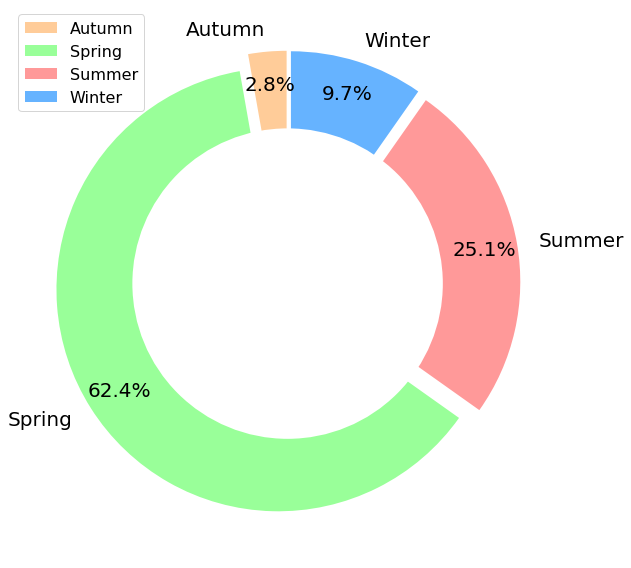

In [14]:
#Plotting pie Chart:
labels = ['Autumn', 'Spring', 'Summer', 'Winter']
sizes = df_ChurnedSeasonality.values

#colors
colors = ['#ffcc99','#99ff99','#ff9999','#66b3ff']
#explsion
explode = (0.05,0.05,0.05,0.05)
 
plt.figure(figsize=(16,8))
plt.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode,textprops={'fontsize': 20})
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
# Equal aspect ratio ensures that pie is drawn as a circle
plt.tight_layout()
plt.legend(prop={'size': 16})

plt.show()

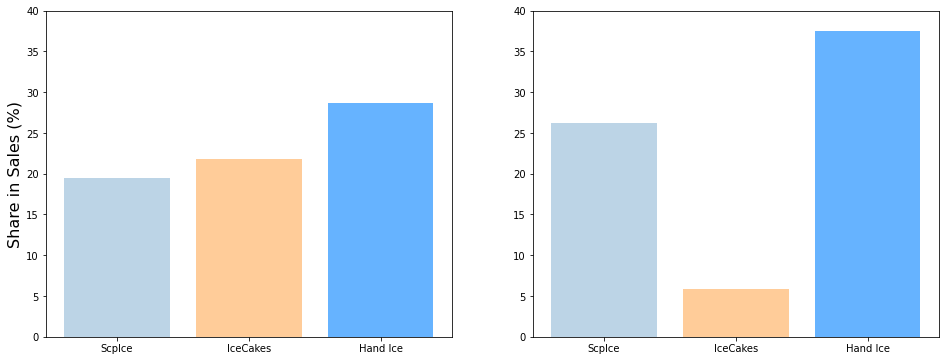

In [15]:
colorIce = ["#bcd4e6","#ffcc99","#66b3ff"]
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
vChurners = [19.454289,21.836058,28.619336]
lChurners = ["ScpIce", "IceCakes","Hand Ice"]
plt.bar(lChurners,vChurners, color=colorIce)
plt.ylim(0,40)
plt.ylabel("Share in Sales (%)", size=16)

plt.subplot(1,2,2)
vNormal = [26.241242,5.885597,37.499064]
lNormal = ["ScpIce","IceCakes","Hand Ice"]
plt.bar(lNormal,vNormal, color=colorIce)
plt.ylim(0,40)

plt.show()

In [16]:
#Further analytics
#As we try to find a relationship (a regression (logistic)) between the churning of a customer and their purchase behavior
#we must start by initializing our data. 

#As our dependent variable we chose the variable Churn as stated previously in question 2.3
#in the dataframe df_CustomerWithDates we have the relevant information, but also less relevant information 
#such as Date and LastVisit so we will drop those columns. Next we will transform the Churn? label into a binary variable. 


#df_CustomersWithDates is defined in Q2.2
df_churner0 = df_CustomersWithDates.drop(columns = ["Date", "LastVisit"])
#This is the df_CustomerWithDates but only containing customer ID and whether or not this customer churns

#now we initialize the LabelEncoder
label_encoder = LabelEncoder()
label_encoder.fit(df_churner0["Churn?"])
df_churner0["Churn_binary"] = label_encoder.transform(df_churner0["Churn?"])
df_churner1 = df_churner0.drop(columns = ["Churn?"])

# df_churner1 is the new dataframe containg customer_id and a 0 if they did not churn, a 1 if they did. 
#print(df_churner1)

#next we will try te derive some (possible) important variables.
# 1) average number of purchases per customer
# 2) average amount spent per purchase per customer
# 3) average spending per month per customer
# 4) average time between purchases per customer

#MAYBE
# 5) purchase in the weekend or not/purchasing on a certain day in the week

In [17]:
#We merge these two dataframes below, if an error occurs you must add a copy of the Visit_ID column 
#to the dataframe so we can merge.
#run this code before: 
df_CompanyVisit["Visit_ID"] = df_CompanyVisit.index
total = pd.merge(df_CompanyVisit, df_VisitDetails, how = "left", on = "Visit_ID")
#Since we are looking at the buyer pattern we only look at the visits that were succesfull (value = 2) 
#(e.g. where something was bought)
total = total[total.VisitOutcome_ID.isin([0,1]) == False]

#total



#Most of the variables that we are going to calculate will be average values (for simplicity)
#As the total timespan for averaging over time I will take the timespan between the first and last purchase
df_new = df_CompanyVisit.groupby("Customer_ID")["Date"].max()
df_old = df_CompanyVisit.groupby("Customer_ID")["Date"].min()
timespan = df_new - df_old


#then, due to the nature of the timespan variable being a time.delta (we can't perform mathematical actions with this var)
#I will convert this variable to an integer. The number of days will be converted to a number of months, this is done via 
#a transformation to a string value and then to an integer value of the days, then the days are divided by 30 for the number
#of months.
lijst = []
for i in timespan:
    text = str(i)
    num, day, time = text.split(" ")
    if int(num) != 0:
        lijst.append(int(num)/30)
    else:
        lijst.append(1)
    
#and we add these information to our churndataframe    
df_churner1["atl_maanden"] = lijst

#df_churner1

In [18]:
# 1) number of average purchases per customer

#first we create a dataframe that tells us the number of succesfull purchases per customer.
df_num_purchases = pd.DataFrame(total.groupby("Customer_ID")["Visit_ID"].nunique())
df_num_purchases.columns = ["num_purchases"]

#We merge our newfound dataframe to our previous churning dataframe, all NA values are filled in by a 0. 
df_churner2 = pd.merge(df_churner1, df_num_purchases, how = "left", on = "Customer_ID")
df_churner2["num_purchases"] = df_churner2["num_purchases"].fillna(0)

#the average number of purchases per month are found by dividing the total number of purchases by the number of months
#in the timespan of the customer
df_churner2["av_num_purch_month"] = df_churner2["num_purchases"]/df_churner2["atl_maanden"]

#df_churner2

In [19]:
#2) Average amount spent per purchase
amount = df_CompletePriceFrame.groupby("Customer_ID")["RevenueProduct"].sum() #total amount spent per customer.

df_churner3 = pd.merge(df_churner2, amount, how = "left", on = "Customer_ID")
df_churner3["RevenueProduct"] = df_churner3["RevenueProduct"].fillna(0) #we fillin all the NA values with a 0. 

#The average amount spent per purchase is added to the dataframe, all NA values are filled with a 0.
df_churner3["av_revenue_spent_per_purchase"] = (df_churner3["RevenueProduct"]/df_churner3["num_purchases"]).fillna(0)

In [20]:
#3) average spending per month per customer
df_churner3["av_revenue_per_month"] = df_churner3["RevenueProduct"]/df_churner3["atl_maanden"]

In [21]:
#4) average time between purchases per customer

#we create a for loop where we itereate over the unique customer_ID. For each customer ID we will look at all the datetime values
#present. We sort the date times for each customer_ID from most recent to least recent, this block of info of all dates
#per customer_ID is called the subset. 
#In this subset we iterate over all dates and we take the difference between two consecutive dates to measure the timespan between
#the purchases. If the timespan equals 0 that means that there were multiple products/deliviries on that date so we can omit those
#values via the if statement. 
#finally we transoform our date time argument to an int via the int(diff.days) fucntion and save everything in a dictionairy
boekje = dict() 
for cust in total["Customer_ID"].unique(): 
    subset = total[total["Customer_ID"]== cust].sort_values(by = "Date", ascending = False)
    l = []
    for i in range(0, len(subset.index)-1): 
        diff = subset.iloc[i, 4] - subset.iloc[i+1,4]                   #IMPORTANT!!!!!!! The Date column in the total
        if int(diff.days) > 0:                                          #dataframe is the 5the column (so 4th index). 
            l.append(int(diff.days))                                    #suppose there is an error, double check if the fifth
        else:                                                           #column is still Date, otherwise change it
            continue 
    try:
        gem = st.mean(l)
    except:
        gem = None
    boekje[cust] = gem

#We transform our dictionairy to a dataframe
df_av_time_between_purchases = pd.DataFrame.from_dict(boekje, orient = 'index')

#we give a name to our first column and we add a duplicate of our CUSTOMER_ID so that we can merge in the next step
df_av_time_between_purchases.columns = ["Av_num_days_between_purchases"]
df_av_time_between_purchases["Customer_ID"] = df_av_time_between_purchases.index


#merge the dataframes to get churner4
df_churner4 = pd.merge(df_churner3, df_av_time_between_purchases, how = "left", on = "Customer_ID")
df_churner4["Av_num_days_between_purchases"] = df_churner4["Av_num_days_between_purchases"].fillna(730)
#For all the customers that have a 0 for time between purchases we give a value of 730 days, this means that they didnt buy
#anything during the two years that the dataset exists.

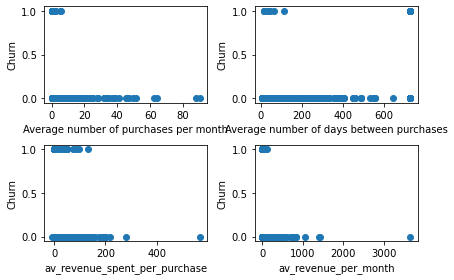

In [23]:
#so as we start with our logistic regression we have the following:
#dependent variable = Churn_binary

#independent variable =
# -av_num_purch_month 
# -Av_num_days_between_purchases
# -av_amount_spent_per_purchase
# -av_spending_per_month

lr_model1 = LogisticRegression()
lr_model2 = LogisticRegression()
lr_model3 = LogisticRegression()
lr_model4 = LogisticRegression()


lr_model1.fit(df_churner4[["av_num_purch_month"]], df_churner4["Churn_binary"])
lr_model2.fit(df_churner4[["Av_num_days_between_purchases"]], df_churner4["Churn_binary"])
lr_model3.fit(df_churner4[["av_revenue_spent_per_purchase"]], df_churner4["Churn_binary"])
lr_model4.fit(df_churner4[["av_revenue_per_month"]], df_churner4["Churn_binary"])

churn_est1 = lr_model1.predict(df_churner4[["av_num_purch_month"]])
churn_est2 = lr_model1.predict(df_churner4[["Av_num_days_between_purchases"]])
churn_est3 = lr_model1.predict(df_churner4[["av_revenue_spent_per_purchase"]])
churn_est4 = lr_model1.predict(df_churner4[["av_revenue_per_month"]])


plt.subplot(2,2,1)
plt.scatter(df_churner4["av_num_purch_month"], df_churner4["Churn_binary"])
plt.xlabel("Average number of purchases per month")
plt.ylabel("Churn")

plt.subplot(2,2,2)
plt.scatter(df_churner4["Av_num_days_between_purchases"], df_churner4["Churn_binary"])
plt.xlabel("Average number of days between purchases")
plt.ylabel("Churn")

plt.subplot(2,2,3)
plt.scatter(df_churner4["av_revenue_spent_per_purchase"], df_churner4["Churn_binary"])
plt.xlabel("av_revenue_spent_per_purchase")
plt.ylabel("Churn")


plt.subplot(2,2,4)
plt.scatter(df_churner4["av_revenue_per_month"][df_churner4["av_revenue_per_month"] < 20000], df_churner4["Churn_binary"][df_churner4["av_revenue_per_month"] < 20000])
plt.xlabel("av_revenue_per_month")
plt.ylabel("Churn")

plt.tight_layout()


#Our predictions for these variables are not really that significant so maybe some other variables should be looked at,

#the confusion matrix is rather useless because we 'predict' that almost every customer won't churn according to our definition
#sklearn.metrics.confusion_matrix(df_churner4["Churn_binary"] , churn_est1)
#sklearn.metrics.confusion_matrix(df_churner4["Churn_binary"] , churn_est2)
#sklearn.metrics.confusion_matrix(df_churner4["Churn_binary"] , churn_est3)
#sklearn.metrics.confusion_matrix(df_churner4["Churn_binary"] , churn_est4)

In [24]:
#Next we will look at the relationship between churners and the customerreviews of the service they got:

df_Reviews["Customer_ID"] = df_Reviews.index

#Firstly we take the Reviews dataframe containing the review score and the customer_ID
#And turn the str review into a score 
def reviewScore(review: str):
    if(review == "Excellent service, very satisfied"):
        return 4
    elif(review == "Good service, satisfied"):
        return 3
    elif(review == "No opinion"):
        return 2
    elif(review == "Not completely satisfied"):
        return 1
    else:
        return 0
def getScorePercentage(review: int):
    return (review/4)*100
#Using this function we can determine how satisfied customers are overall:
#We use a reviewScore from 0 to 4 and express it in a percentage for clarity
#by divinding these scores by 4 and multiplying them with 100

#We apply both these functions and store the results in new columns
#In the reviews data frame
df_Reviews["reviewScore"]=df_Reviews["Review"].apply(reviewScore)

df_churn_reviews = pd.merge(df_Reviews, df_churner1, on = "Customer_ID", how = "left")

print(pd.crosstab(df_churn_reviews["Review"], df_churn_reviews["Churn_binary"]))
#Here we clearly see that most of our churners are located in the groep no opinion, not completely satisfied.

print(pd.crosstab(df_churn_reviews["Review"], df_churn_reviews["Churn_binary"], normalize = "index"))
#If we look at the percentage then it clearly shows that we must focus on the bottom three groups where there is a rather high
#churnrate of 3.38, 14.5 and 4 percent. We must focus these groups! How? 

#Increase the quality of the products -> out of our knowledge
#Better routeplanning for faster and more flexible deliviers  -> already know that
#Train the employees better on these routes so that the customer experience increases!

dissatisfied_cust = df_churn_reviews[df_churn_reviews["reviewScore"] <= 2]

Churn_binary                           0   1
Review                                      
Excellent service, very satisfied    474   0
Good service, satisfied             2169   8
No opinion                          1915  67
Not completely satisfied             367  62
Very bad service, very unsatisfied    48   2
Churn_binary                               0         1
Review                                                
Excellent service, very satisfied   1.000000  0.000000
Good service, satisfied             0.996325  0.003675
No opinion                          0.966196  0.033804
Not completely satisfied            0.855478  0.144522
Very bad service, very unsatisfied  0.960000  0.040000


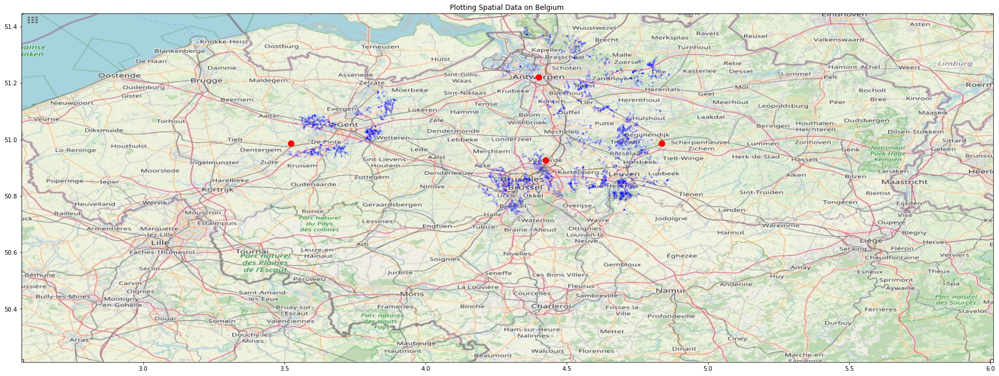

In [25]:
#Q2.5 Are there clusters of customers? How would you describe these different clusters?


#We add the CLV data to the dataframe, CLV is defined in Q2.3
df_CustomerType["CLV"]=df_CLV
df_CustomerType = df_CustomerType.dropna(axis="rows")
#df_RouteTemplate["RouteTemplate_ID"]=df_RouteTemplate.index


#Q2.5 Are there clusters of customers? How would you describe these different clusters?

#let's start by looking at the maximum range of the coordinates, we create a Bounding Box
BBox = ((df_Position["LONG"].min(), df_Position["LONG"].max(), df_Position["LAT"].min(), df_Position["LAT"].max()))
#the min and max LONG and LAT are respectively: (3.334474113603079, 4.707188589012247, 49.62586258530627, 51.39655183995949)

#Next we load a screenshot of belgium, this screenshot was taken on the website: 
#https://www.openstreetmap.org/export#map=9/50.8181/4.3698
#with the borders set on (2.5681,6.0095,50.2121,51.4472). 
#These borders are larger than the BBox values but that's because this results in a more clear picture

directory = "ma.jpg"       #SET DIRECTORY VOOR WAAR UW LEGE MAP OPGESLAGEN IS
afb = plt.imread(directory) #download the map and change directory


#finally start plotting al the coordinates in blue, and the depot coordinates.
#for coordinates from the depot I just took the coordinates from the city it is located on (searched on google)
fig, ax = plt.subplots(figsize = (30,60))
ax.scatter(df_Position.LONG, df_Position.LAT, zorder=1, alpha= 0.1, c='b', s=5) #plotten van de coordinaten op de kaart
ax.set_title('Plotting Spatial Data on Belgium')
ax.set_xlim(2.5681,6.0095)
ax.set_ylim(50.2121,51.4472)
ax.scatter([3.5235857, 4.3997081, 4.8365218, 4.4257868],                    #coordinaten van respectievelijk DEINZE, ANTWERPEN, 
            [50.9875406, 51.2211097, 50.9859959, 50.9272511],               #Aarschot en Vilvoorde
           zorder = 1, c = 'r', s=100)   
ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

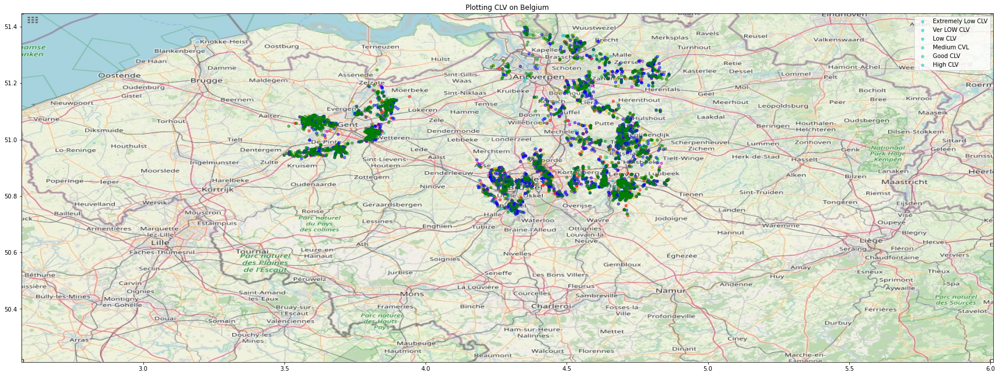

In [26]:
#Next we are going to plot our customers again, but this time based on different 
#properties to try and find a relationship between income and sales!

####IT TAKES A COUPLE OF MINUTES TO RUN, ALL PLOTS AFTER THIS DO 99% THE SAME SO I PUT THEM IN COMMENT
#THAT WHY I WILL TURN THE CODE INTO COMMENTS SO IT WONT AUTO-RUN####


CLV2 = pd.DataFrame(df_CLV)

df_Position["Customer_ID"] = df_Position.index
df_location_value = pd.merge(CLV2, df_Position, how = "left", on = "Customer_ID")
fig, ax = plt.subplots(figsize = (30,60))

#COMMENT:we split up our CLV in 5 levels based on an inspection of the 
#COMMENT: distribution of the data, each level gets a different color.

for i in range(0,len(df_location_value)):
    if df_location_value.iloc[i,1] <= 100:

#COMMENT: for this loop to work our CLV must be the first 
#COMMENT: value in the col (ind 0) and the coordinates column 3 and 4 (ind 2 and 3)

        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='g', s=20)
    elif (100 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 200):
        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='b', s=20)
    elif (200 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 300):
        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='y', s=20)
    elif (300 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 400): 
        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='r', s=20)
    elif (400 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 500):
        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='m', s=20)
    else:
        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='c', s=20)
    
ax.set_title('Plotting CLV on Belgium')
ax.set_xlim(2.5681,6.0095)
ax.set_ylim(50.2121,51.4472)

ax.legend(["Extremely Low CLV", "Ver LOW CLV", "Low CLV", "Medium CVL", "Good CLV", "High CLV"])

ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

#as we mostly see green and blue (that is a CLV of lower than 200) we will split up our two plots to have a better look
#and maybe we are able to see a better relationship between the city/more expensive regions

In [27]:
#Repeat the same proces without the CLV < 100

#fig, ax = plt.subplots(figsize = (30,60))

#for i in range(0,len(df_location_value)):
#    if df_location_value.iloc[i,1] <= 100:
#        continue
#    elif (100 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 200):
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='b', s=20)
#    elif (200 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 300):
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='y', s=20)
#    elif (300 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 400): 
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='r', s=20)
#    elif (400 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 500):
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='m', s=20)
#    else:
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='c', s=20)
        
#ax.set_title('Plotting CLV on Belgium')
#ax.set_xlim(2.5681,6.0095)
#ax.set_ylim(50.2121,51.4472)

#ax.legend(["Ver LOW CLV", "Low CLV", "Medium CVL", "Good CLV", "High CLV"])

#ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

In [28]:
#Repeat the same proces without the CLV < 200

#fig, ax = plt.subplots(figsize = (30,60))

#for i in range(0,len(df_location_value)):
#    if df_location_value.iloc[i,1] <= 100:
#        continue
#    elif (100 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 200):
#        continue
#    elif (200 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 300):
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='y', s=40)
#    elif (300 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 400): 
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='r', s=40)
#    elif (400 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 500):
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='m', s=40)
#    else:
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='c', s=40)
        
#ax.set_title('Plotting CLV on Belgium')
#ax.set_xlim(2.5681,6.0095)
#ax.set_ylim(50.2121,51.4472)

#ax.legend(["Low CLV", "Medium CVL", "Good CLV", "High CLV"])

#ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')
        

In [29]:
#Repeat the same proces without the CLV < 300

#fig, ax = plt.subplots(figsize = (30,60))

#for i in range(0,len(df_location_value)):
#    if df_location_value.iloc[i,1] <= 100:
#        continue
#    elif (100 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 200):
#        continue
#    elif (200 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 300):
#        continue
#    elif (300 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 400): 
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='r', s=40)
#    elif (400 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 500):
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='m', s=40)
#    else:
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='c', s=40)
        
#ax.set_title('Plotting CLV on Belgium')
#ax.set_xlim(2.5681,6.0095)
#ax.set_ylim(50.2121,51.4472)

#ax.legend(["Medium CVL", "Good CLV", "High CLV"])

#ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

In [30]:
#Repeat the same proces without the CLV < 400

#fig, ax = plt.subplots(figsize = (30,60))

#for i in range(0,len(df_location_value)):
#    if df_location_value.iloc[i,1] <= 100:
#        continue
#    elif (100 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 200):
#        continue
#    elif (200 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 300):
#        continue
#    elif (300 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 400): 
#        continue
#    elif (400 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 500):
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='m', s=40)
#    else:
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='c', s=40)
        
#ax.set_title('Plotting CLV on Belgium')
#ax.set_xlim(2.5681,6.0095)
#ax.set_ylim(50.2121,51.4472)

#ax.legend([ "Good CLV", "High CLV"])

#ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

In [31]:
#Repeat the same proces without the CLV < 500

#fig, ax = plt.subplots(figsize = (30,60))

#for i in range(0,len(df_location_value)):
#    if df_location_value.iloc[i,1] <= 100:
#        continue
#    elif (100 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 200):
#        continue
#    elif (200 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 300):
#        continue
#    elif (300 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 400): 
#        continue
#    elif (400 < df_location_value.iloc[i,1]) and (df_location_value.iloc[i,1] <= 500):
#        continue
#    else:
#        ax.scatter(df_location_value.iloc[i,2], df_location_value.iloc[i,3], zorder=1, alpha= 0.5, c='c', s=40)
        
#ax.set_title('Plotting CLV on Belgium')
#ax.set_xlim(2.5681,6.0095)
#ax.set_ylim(50.2121,51.4472)

#ax.legend(["High CLV"])

#ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

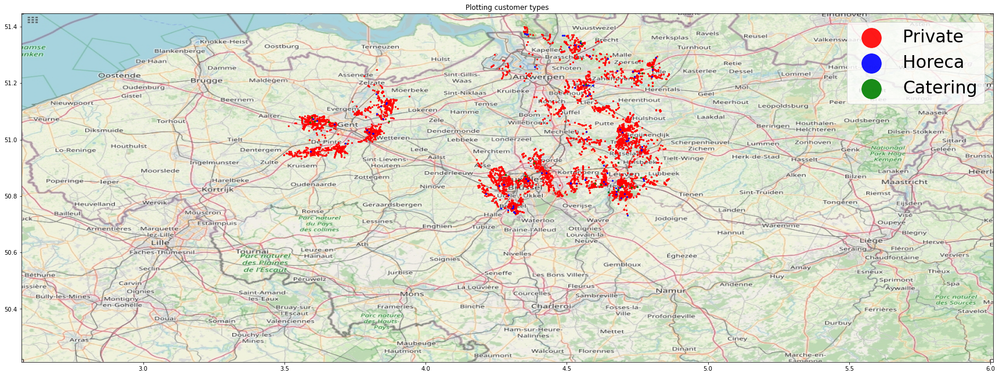

In [32]:
#Next we look at the customers based on their Customertype
df_location_type = pd.merge(df_CustomerType, df_Position, on = "Customer_ID", how = "left")
kleuren_lijstje = ["r", "b", "g"]
indexje = 0

fig, ax = plt.subplots(figsize = (30,50))
for i in df_location_type["CustomerType"].unique():
    coord = df_location_type[df_location_type["CustomerType"] == i]
    ax.scatter(coord.LONG, coord.LAT, zorder=1, alpha= 0.9, color = kleuren_lijstje[indexje], s=5, label = i)
    indexje += 1
    
ax.set_title('Plotting customer types')


ax.set_xlim(2.5681,6.0095)
ax.set_ylim(50.2121,51.4472)
ax.legend(markerscale = 15.0, prop={'size': 30})
ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

#As our plot clearly shows an abundant set of private customers, we take a look without this customertype 'private'.

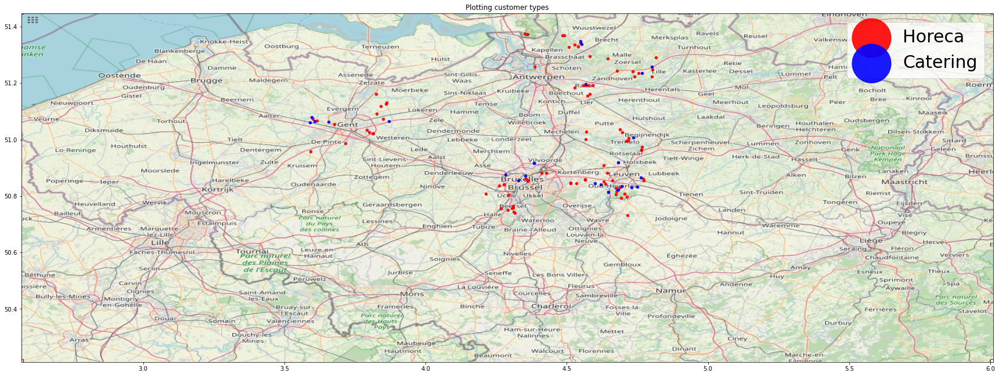

In [33]:
#We repeat the proces but now without the customertype of 'private'

kleuren_lijstje2 = ["b", "g"]
indexje = 0

fig, ax = plt.subplots(figsize = (30,50))
for i in df_location_type["CustomerType"].unique()[1:3]:
    coord = df_location_type[df_location_type["CustomerType"] == i]
    ax.scatter(coord.LONG, coord.LAT, zorder=1, alpha= 0.9, color = kleuren_lijstje[indexje], s=20, label = i)
    indexje += 1
    
ax.set_title('Plotting customer types')


ax.set_xlim(2.5681,6.0095)
ax.set_ylim(50.2121,51.4472)
ax.legend(markerscale = 15.0, prop={'size': 30})
ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

#As our plot clearly shows an abundant set of private customars, we take a look without this customertype.

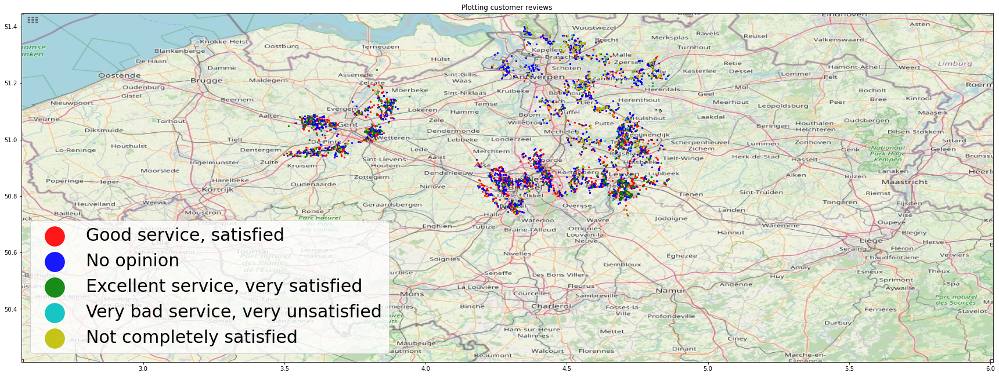

In [34]:
#Next we look at our customers based on the reviews that they left. 


df_location_review = pd.merge(df_Reviews, df_Position, on = "Customer_ID", how = "left")

kleuren_lijstje3 = ["r","b", "g", "c", "y"]
indexje2 = 0

fig, ax = plt.subplots(figsize = (30,50))
for i in df_location_review["Review"].unique():
    coord = df_location_review[df_location_review["Review"] == i]
    ax.scatter(coord.LONG, coord.LAT, zorder=1, alpha= 0.9, color = kleuren_lijstje3[indexje2], s=5, label = i)
    indexje2 += 1
    
ax.set_title('Plotting customer reviews')


ax.set_xlim(2.5681,6.0095)
ax.set_ylim(50.2121,51.4472)
ax.legend(markerscale = 15.0, prop={'size': 30})
ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')


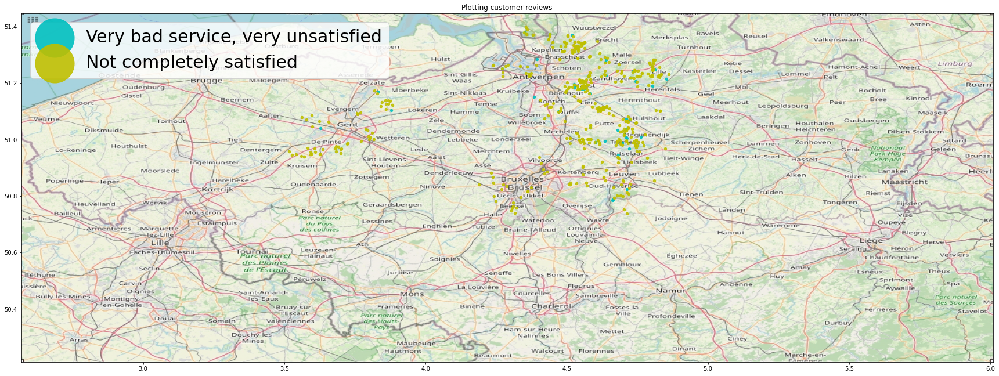

In [35]:
#We repeat the exact same proces but only for the worst two reviews

kleuren_lijstje4 = ["c", "y"]
indexje3 = 0

fig, ax = plt.subplots(figsize = (30,50))
for i in df_location_review["Review"].unique()[3:5]:
    coord = df_location_review[df_location_review["Review"] == i]
    ax.scatter(coord.LONG, coord.LAT, zorder=1, alpha= 0.9, color = kleuren_lijstje4[indexje3], s=20, label = i)
    indexje3 += 1
    
ax.set_title('Plotting customer reviews')


ax.set_xlim(2.5681,6.0095)
ax.set_ylim(50.2121,51.4472)
ax.legend(markerscale = 15.0, prop={'size': 30})
ax.imshow(afb, zorder=0, extent = (2.5681,6.0095,50.2121,51.4472), aspect= 'equal')

In [36]:
#Q2.6 Do customers have different buying patterns during the weekend?


#We now seperate the dataframe in 2: One has the visits and revenue from weekdays only
#While the other has only the information from visits on weekends
OnlyWeekdays= df_CompletePriceFrame[df_CompletePriceFrame["DateIndex"] != "weekend"]
OnlyWeekends= df_CompletePriceFrame[df_CompletePriceFrame["DateIndex"] != "weekday"]

#We can now analyse the overal revenue by customers ordered
# We devide by 5 for weekdays and 2 for weekends to rescale to a weekday or weekendday 
OnlyWeekdaysCus = OnlyWeekdays.groupby(["Customer_ID","DateIndex"])["RevenueProduct"].sum()/5
OnlyWeekendsCus = OnlyWeekends.groupby(["Customer_ID","DateIndex"])["RevenueProduct"].sum()/2

#We compare these sales with eachother in the following dataframe
Comparison = pd.merge(OnlyWeekdaysCus,OnlyWeekendsCus, on="Customer_ID")

#X is a weekday Y is weekend day
#This shows the difference in Revenue expressed in mean and other statistics
#Comparing the weekend and weekdays
#print(Comparison.describe())


#Firstly we look at the family of the product
OnlyWeekdaysFam =  (OnlyWeekdays.groupby("Family")["RevenueProduct"].sum())/5
OnlyWeekendsFam =  (OnlyWeekends.groupby("Family")["RevenueProduct"].sum())/2

OnlyWeekdaysFam=(OnlyWeekdaysFam/OnlyWeekdaysFam.values.sum())*100
OnlyWeekendsFam=(OnlyWeekendsFam/OnlyWeekendsFam.values.sum())*100

#X is weekdays Y is weekends
#This show what Family sells more during either weekend or weekday
WeekendComparedFam = pd.merge(OnlyWeekdaysFam,OnlyWeekendsFam, on="Family")
print(WeekendComparedFam)

#We do the same process for decription
OnlyWeekdaysDes =  (OnlyWeekdays.groupby("Description")["RevenueProduct"].sum())/5
OnlyWeekendsDes =  (OnlyWeekends.groupby("Description")["RevenueProduct"].sum())/5

OnlyWeekdaysDes=(OnlyWeekdaysDes/OnlyWeekdaysDes.values.sum())*100
OnlyWeekendsDes=(OnlyWeekendsDes/OnlyWeekendsDes.values.sum())*100

#X is weekdays Y is weekends
#This show which products sell more during either weekend or weekday
WeekendComparedDis= pd.merge(OnlyWeekdaysDes,OnlyWeekendsDes, on="Description")
print(WeekendComparedDis)

#We do the same process for Category
OnlyWeekdaysCat =  (OnlyWeekdays.groupby("Category")["RevenueProduct"].sum())/5
OnlyWeekendsCat =  (OnlyWeekends.groupby("Category")["RevenueProduct"].sum())/5

OnlyWeekdaysCat=(OnlyWeekdaysCat/OnlyWeekdaysCat.values.sum())*100
OnlyWeekendsCat=(OnlyWeekendsCat/OnlyWeekendsCat.values.sum())*100
#X is weekdays Y is weekends
#This show which product Catogoryy sell more during either weekend or weekday
WeekendComparedCat= pd.merge(OnlyWeekdaysCat,OnlyWeekendsCat, on="Category")
print(WeekendComparedCat)


#we print this to compare complete sales: you sell more over saturday and sunday
#than all other weekdays combined
OnlyWeekdaysSum = OnlyWeekdays["RevenueProduct"].sum()
OnlyWeekendsSum = OnlyWeekends["RevenueProduct"].sum()

print("Revenue from weekdays: ", OnlyWeekdaysSum)
print("Revenue from weekends: ", OnlyWeekendsSum)


                    RevenueProduct_x  RevenueProduct_y
Family                                                
Assortments                 5.656206          5.899114
BIG                         0.930809          1.020373
Coffee                      2.960728          3.020951
Coupon                      0.339425          0.021096
Cups                       11.176284          8.928778
Garniture                   0.936532          1.809015
Hand Ice                   37.544913         37.381824
Ice Cakes                   5.656566          6.370696
Individual Dessert          5.035762          5.189271
Meals                       3.454759          4.075612
POS inside                  0.067329          0.065014
Scoop Ice                  26.240689         26.218255
                            RevenueProduct_x  RevenueProduct_y
Description                                                   
1 L.Aardbei                         0.242663          0.176672
1 L.Amarena                         0.003

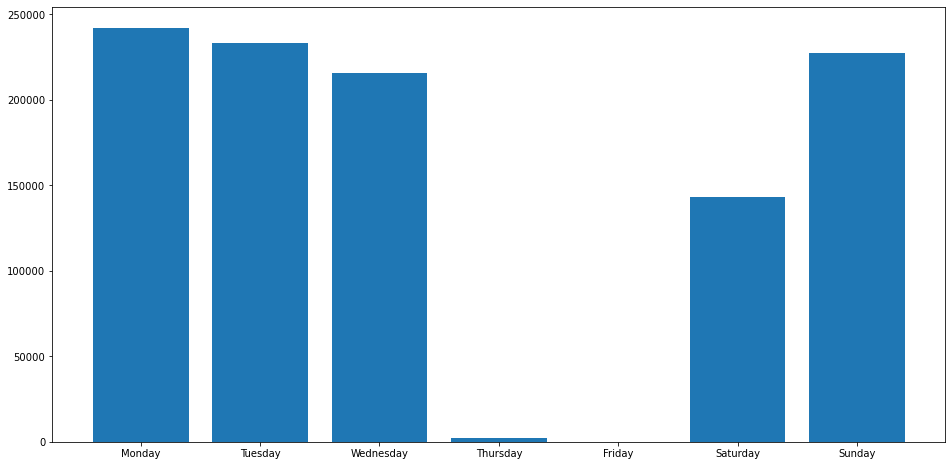

In [37]:
def getWeekday(d: datetime.date):
    if(d.weekday()==0):
        return "Monday"
    elif(d.weekday()==1):
        return "Tuesday"
    elif(d.weekday()==2):
        return "Wednesday"
    elif(d.weekday()==3):
        return "Thursday"
    elif(d.weekday()==4):
        return "Friday"
    elif(d.weekday()==5):
        return "Saturday"
    elif(d.weekday()==6):
        return "Sunday"


df_CompletePriceFrame["DAYOFWEEK"] = df_CompletePriceFrame["Date"].apply(getWeekday)
df_REV_Weekday = df_CompletePriceFrame.groupby("DAYOFWEEK")["RevenueProduct"].sum()

labelsWe= ["Monday", 'Tuesday','Wednesday','Thursday', 'Friday', 'Saturday', 'Sunday']
valuesWe= [242286.25,233293.15,215781.00,    2336.40     ,    65.10, 143315.70,227372.20] #From df_REV_Weekday.values and then put to the corresponding day

plt.figure(figsize= (16,8))
plt.bar(labelsWe,valuesWe)
plt.show()

In [38]:
#Q2.7 Do customer sales differ across different cities? Is there a relationship between customer
#sales and average income per inhabitant (and other factors)?

df_RouteTemplate["RouteTemplate_ID"] = df_RouteTemplate.index


#This compares CLV over all regions merging over Routetempate to get CLV linked to The Region
df_CLV_Route = pd.merge(df_CustomerType,df_RouteTemplate, on="RouteTemplate_ID")
df_CLV_Route_Region = df_CLV_Route.groupby("REGION")["CLV"].sum()
#print(df_CLV_Route_Region)

#Compares CLV over all Cities
#We change the name of the column to be able to merge on the same name
#print(df_Depot.drop(columns="RouteTemplate_ID"))
df_Depot=df_Depot.rename(columns={"HVROUTETEMPLATE_NRID": "RouteTemplate_ID"})
df_CLV_Cities= pd.merge(df_CLV_Route,df_Depot,on="RouteTemplate_ID").groupby("DEPOT")["CLV"].sum()

#print(df_CLV_Cities)

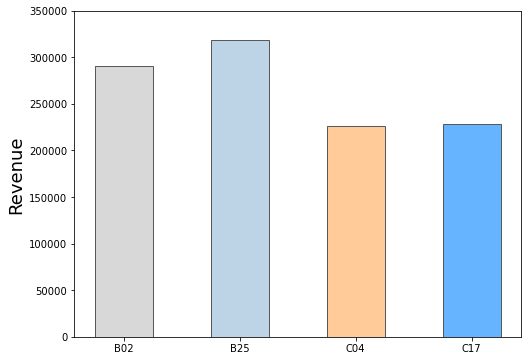

In [40]:
BestRevFamily=df_CompletePriceFrame.groupby("Family")["RevenueProduct"].sum().sort_values(ascending=False)
BestRevFamily=BestRevFamily.sort_values()
Region = ['B02','B25','C04','C17']
revenue = df_CLV_Route_Region.values

colors=["#D8D8D8","#bcd4e6","#ffcc99","#66b3ff"]
plt.figure(figsize=(8,6))
plt.bar(range(4), revenue, color=colors, edgecolor='#585858',width=0.5)
plt.ylim(0,350000)

plt.xticks(range(4),Region)
plt.ylabel("Revenue", size = 18)

plt.rc('xtick', labelsize=13) 
plt.rc('ytick', labelsize=14) 

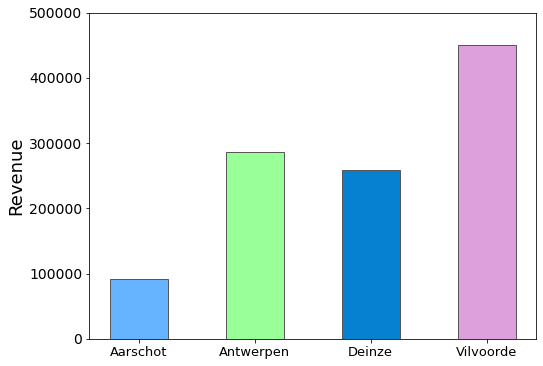

In [41]:

Region = ['Aarschot','Antwerpen','Deinze','Vilvoorde']
revenue = df_CLV_Cities.values

colors=["#66b3ff","#99ff99","#0681D1","#DDA0DD"]
##bcd4e6
#66b3ff
plt.figure(figsize=(8,6))
plt.bar(range(4), revenue, color=colors, edgecolor='#585858',width=0.5)
plt.ylim(0,500000)
plt.xticks(range(4),Region)
plt.ylabel("Revenue", size=18)

plt.rc('xtick', labelsize=13) 

Text(0, 0.5, 'Churn')

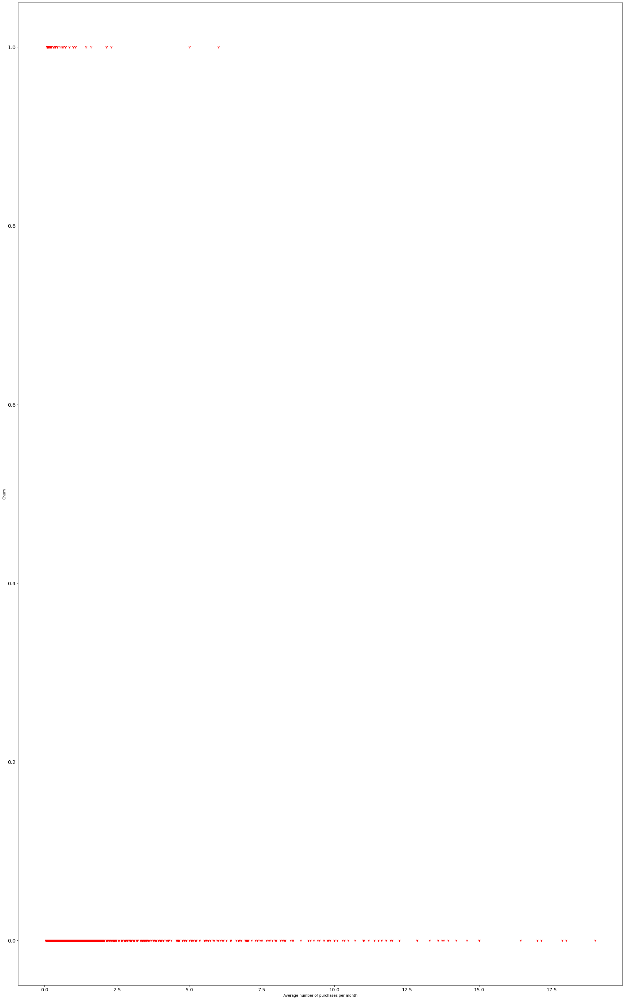

In [43]:
#EXTRA
#Some extra plots that we created for our presentation (Q2.4)
plt.figure(figsize=(30, 50))
plt.scatter(df_churner4["av_num_purch_month"][(df_churner4["av_num_purch_month"]<20) & (df_churner4["av_num_purch_month"] != 0)], 
            df_churner4["Churn_binary"][(df_churner4["av_num_purch_month"]<20) & (df_churner4["av_num_purch_month"] != 0)], 
            c = "r", s=50, marker = "1")

plt.xlabel("Average number of purchases per month")
plt.ylabel("Churn")

Text(0, 0.5, 'Churn')

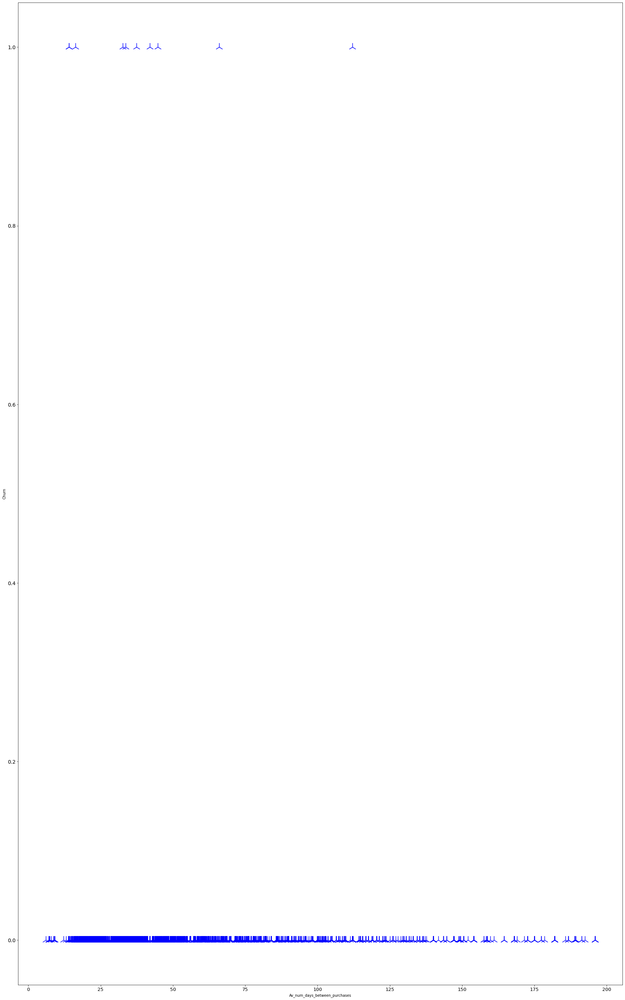

In [44]:
plt.figure(figsize=(30, 50))
plt.scatter(df_churner4["Av_num_days_between_purchases"][df_churner4["Av_num_days_between_purchases"]<200], 
            df_churner4["Churn_binary"][df_churner4["Av_num_days_between_purchases"]<200], 
            c = "b", s=500, marker = "2")

plt.xlabel("Av_num_days_between_purchases")
plt.ylabel("Churn")

Text(0, 0.5, 'Churn')

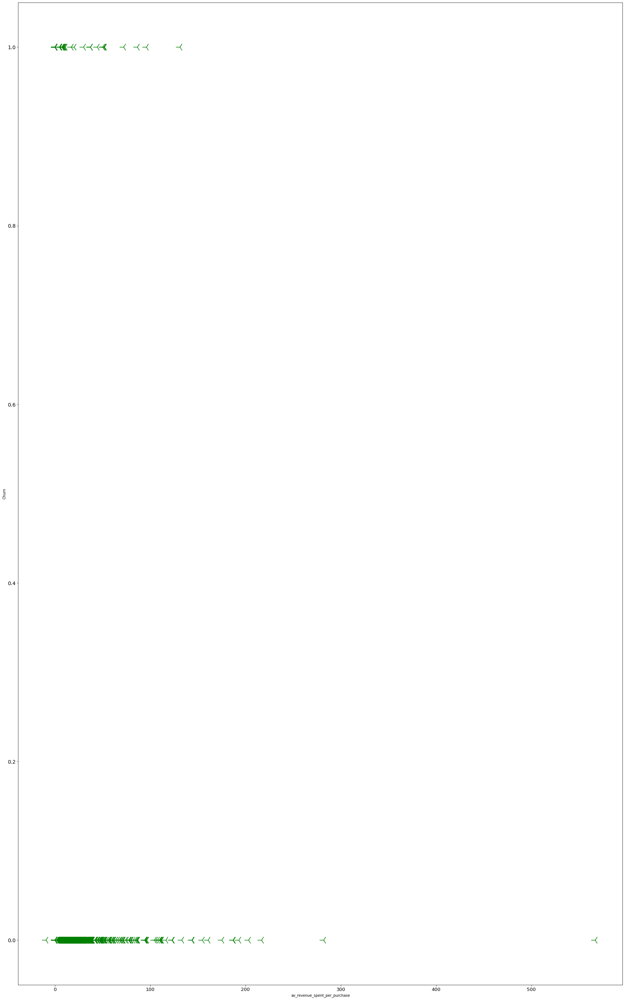

In [45]:
plt.figure(figsize=(30, 50))

plt.scatter(df_churner4["av_revenue_spent_per_purchase"][df_churner4["av_revenue_spent_per_purchase"] < 1500], 
            df_churner4["Churn_binary"][df_churner4["av_revenue_spent_per_purchase"] < 1500], c = "g", s = 500, marker = "3")
plt.xlabel("av_revenue_spent_per_purchase")
plt.ylabel("Churn")

Text(0, 0.5, 'Churn')

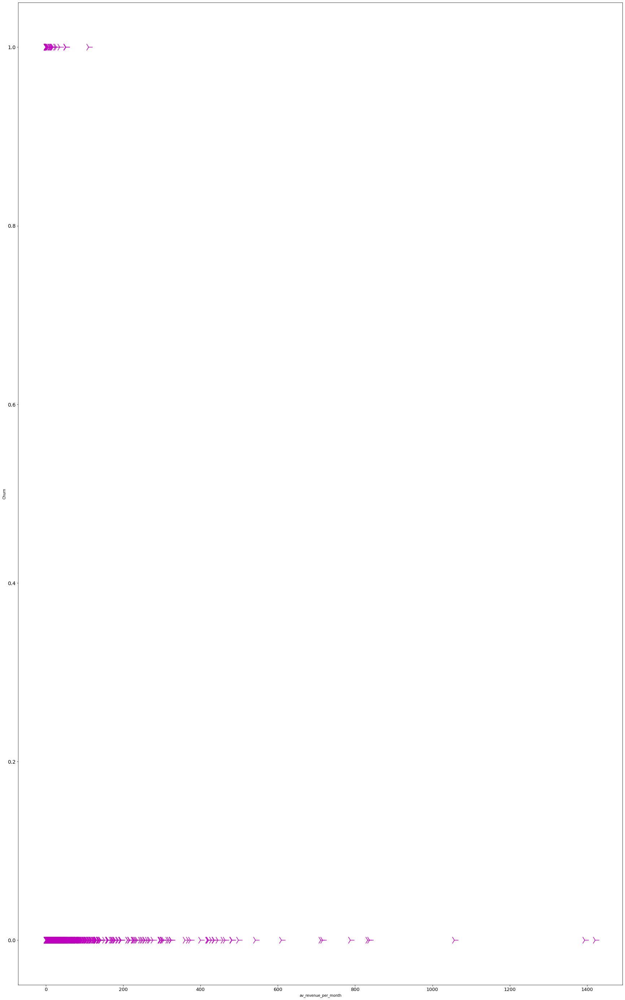

In [46]:
plt.figure(figsize=(30, 50))

plt.scatter(df_churner4["av_revenue_per_month"][df_churner4["av_revenue_per_month"] < 2500], 
            df_churner4["Churn_binary"][df_churner4["av_revenue_per_month"] < 2500], c = "m", s = 500, marker ="4")
plt.xlabel("av_revenue_per_month")
plt.ylabel("Churn")